In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
from datetime import date, time
from matplotlib import pyplot as plt

# load replace utility from dataclasses to manipulate SSRS configuration
from dataclasses import replace

from ssrs import Simulator, Config

/home/rthedin/.conda-envs/ssrs_env/lib/python3.10/site-packages/herbie/archive.py:71: UserWarning: herbie xarray accessors could not be imported.You are probably missing the Carpenter_Workshop.If you want to use these functions, try`pip install git+https://github.com/blaylockbk/Carpenter_Workshop.git`
  warnings.warn(


# Comparison of slope and aspect maps between 3DEP at different resolutions and manually computed from DEM

Note: To execute this notebook, you should checkout the specific commit in which this notebook was _added_. This notebook is a study showing why the orographic quantities are computed at higher resolution. It is for information purposes only and not a tutorial or example on the usage of SSRS.


#### Conclusions of the study presented here:

Calculating quantities using 100-m DEM elevation map results in slope and aspect maps that can be quite different from the same quantities downloaded from 3DEP. Ideally, we want to be able to _compute_ both aspect and slope based on a certain elevation map. If the elevation map is obtained from 3DEP, then the calculated quantities should match the 3DEP. This is needed for blurred versions of the elevation map. 

As shown here, using a 10-m grid for DEM and subsequent calculation of slope and aspect, the results match nicely those downloaded from 3DEP. Therefore, we will change the logic in the handling of these quantities. Now, these quantities will always be _computed_ rather than _downloaded_ from 3DEP. Here we showed that computing them from a 10-m DEM results in similar slope and aspect maps. In order to compute tham accurately, we will _always_ use DEM-related quantities at 10-m grid, regardless of what the user sets as `resolution`. The `resolution` variable is related to the resolution in which the rest of the analysis is conducted. After the slope and aspect are computed using the 10-m resolution DEM, they will be upsampled to match the `resolution` resolution. Even though not recommended, the user can change the high-resolution DEM resolution through the `resolution_terrain` variable; the default being 10 m.

In [3]:
default_config = Config()

## Computing slope and aspect

In [4]:
# 10 m resolution, computing slope and aspect

oro_ori_compute_10m =replace(
    default_config, 
    run_name='orographic_original_compute_10m',
    sim_seed = 30,
    southwest_lonlat = (-106.21, 42.78),
    region_width_km = (60.0, 50.0),
    resolution = 10.,
    sim_mode = 'uniform',
    uniform_windspeed = 10.0,
    uniform_winddirn = 270.0,
    track_direction = 0,
    track_count = 500,
    track_start_region = (5, 55, 1, 2),
    updraft_threshold = 0.75,
    orographic_model = 'original',
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
wy_sim_original_compute_10m = Simulator(oro_ori_compute_10m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: orographic_original_compute_10m
Specified random number seed: 30
Output dir: /home/rthedin/SSRS/notebooks/output/orographic_original_compute_10m
Terrain resolution = 10.0 m
Terrain grid size = (5000, 6000)
Terrain: Bounds set to [-106.28, 42.78, -105.43, 43.25]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 15 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 10.0 m/s
Uniform mode: Wind dirn = 270.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [5]:
# 100 m resolution, computing slope and aspect

oro_ori_compute_100m =replace(
    default_config, 
    run_name='orographic_original_compute_100m',
    sim_seed = 30,
    southwest_lonlat = (-106.21, 42.78),
    region_width_km = (60.0, 50.0),
    resolution = 100.,
    sim_mode = 'uniform',
    uniform_windspeed = 10.0,
    uniform_winddirn = 270.0,
    track_direction = 0,
    track_count = 500,
    track_start_region = (5, 55, 1, 2),
    updraft_threshold = 0.75,
    orographic_model = 'original',
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
wy_sim_original_compute_100m = Simulator(oro_ori_compute_100m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: orographic_original_compute_100m
Specified random number seed: 30
Output dir: /home/rthedin/SSRS/notebooks/output/orographic_original_compute_100m
Terrain resolution = 100.0 m
Terrain grid size = (500, 600)
Terrain: Bounds set to [-106.28, 42.78, -105.44, 43.25]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 15 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 10.0 m/s
Uniform mode: Wind dirn = 270.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


## Getting slope and aspect from 3DEP

In [6]:
# 10 m resolution, getting slope and aspect from 3DEP

oro_ori_3dep_10m =replace(
    default_config, 
    run_name='orographic_original_3dep_10m',
    sim_seed = 30,
    southwest_lonlat = (-106.21, 42.78),
    region_width_km = (60.0, 50.0),
    resolution = 10.,
    sim_mode = 'uniform',
    uniform_windspeed = 10.0,
    uniform_winddirn = 270.0,
    track_direction = 0,
    track_count = 500,
    track_start_region = (5, 55, 1, 2),
    updraft_threshold = 0.75,
    orographic_model = 'original',
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
wy_sim_original_3dep_10m = Simulator(oro_ori_3dep_10m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: orographic_original_3dep_10m
Specified random number seed: 30
Output dir: /home/rthedin/SSRS/notebooks/output/orographic_original_3dep_10m
Terrain resolution = 10.0 m
Terrain grid size = (5000, 6000)
Terrain: Bounds set to [-106.28, 42.78, -105.43, 43.25]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 15 tiles..
Terrain: Downloading Slope Degrees data from 3DEP..
WMS: Downloading data for 15 tiles..
Terrain: Downloading Aspect Degrees data from 3DEP..
WMS: Downloading data for 15 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 10.0 m/s
Uniform mode: Wind dirn = 270.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [7]:
# 100 m resolution, getting slope and aspect from 3DEP

oro_ori_3dep_100m =replace(
    default_config, 
    run_name='orographic_original_3dep_100m',
    sim_seed = 30,
    southwest_lonlat = (-106.21, 42.78),
    region_width_km = (60.0, 50.0),
    resolution = 100.,
    sim_mode = 'uniform',
    uniform_windspeed = 10.0,
    uniform_winddirn = 270.0,
    track_direction = 0,
    track_count = 500,
    track_start_region = (5, 55, 1, 2),
    updraft_threshold = 0.75,
    orographic_model = 'original',
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
wy_sim_original_3dep_100m = Simulator(oro_ori_3dep_100m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: orographic_original_3dep_100m
Specified random number seed: 30
Output dir: /home/rthedin/SSRS/notebooks/output/orographic_original_3dep_100m
Terrain resolution = 100.0 m
Terrain grid size = (500, 600)
Terrain: Bounds set to [-106.28, 42.78, -105.44, 43.25]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 15 tiles..
Terrain: Downloading Slope Degrees data from 3DEP..
WMS: Downloading data for 15 tiles..
Terrain: Downloading Aspect Degrees data from 3DEP..
WMS: Downloading data for 15 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 10.0 m/s
Uniform mode: Wind dirn = 270.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


# Plots

### Plot matching prior results 

Using same plotting function, `imshow`, and same colorscale. Same results will be plotted again using `pcolormesh` and twilight colormap. This is just to show that we obtain prior results using 100 m resolution and downloading slope and aspect from 3DEP.

Note how `imshow` can significantly change the visual representation of the results-- this is an artifact of the plotting method, not the data. The results from cell 8 are the same as those from cell 10.

Plotting updraft fields..


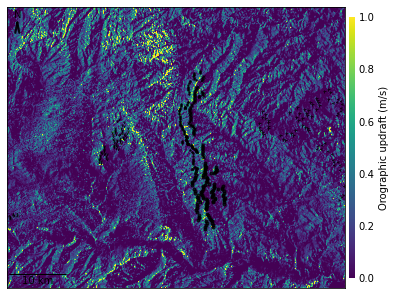

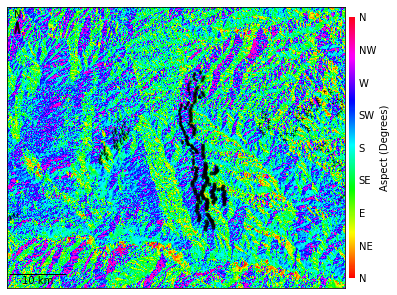

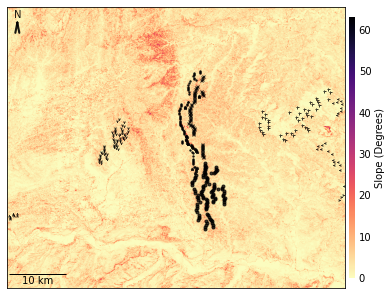

In [8]:
# plots that match results with version of the code with workshop tag
wy_sim_original_3dep_100m.plot_updrafts(show=True, apply_threshold=False, plot='imshow')
wy_sim_original_3dep_100m.plot_terrain_aspect(show=True, plot='imshow', cmap='hsv')
wy_sim_original_3dep_100m.plot_terrain_slope(show=True, plot='imshow')

## 100 m resolution, computed quantities

Plotting updraft fields..
Manually computing aspect..
Manually computing slope..


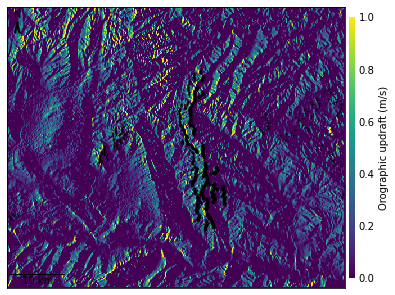

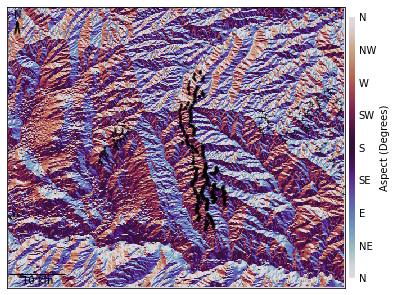

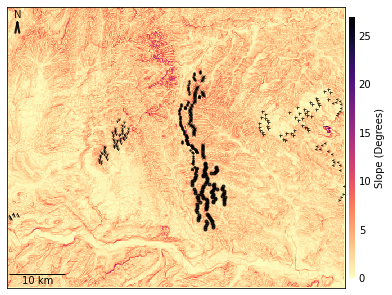

In [9]:
wy_sim_original_compute_100m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh')
wy_sim_original_compute_100m.plot_terrain_aspect(show=True, plot='pcolormesh')
wy_sim_original_compute_100m.plot_terrain_slope(show=True, plot='pcolormesh')

## 100 m resolution, 3DEP quantities

Plotting updraft fields..


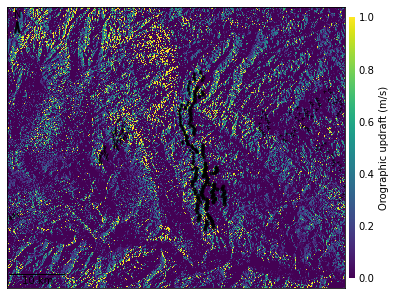

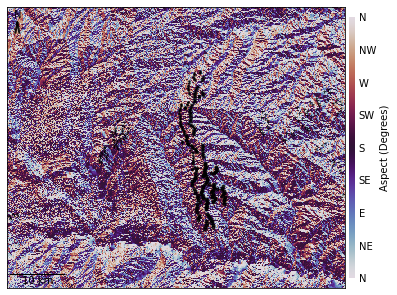

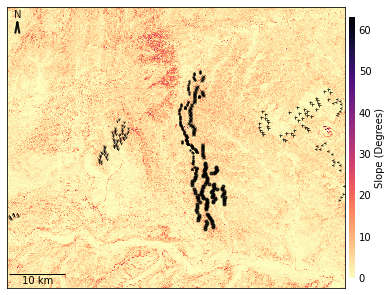

In [10]:
wy_sim_original_3dep_100m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh')
wy_sim_original_3dep_100m.plot_terrain_aspect(show=True, plot='pcolormesh')
wy_sim_original_3dep_100m.plot_terrain_slope(show=True, plot='pcolormesh')

## 10 m resolution, computed quantities

Plotting updraft fields..
Manually computing aspect..
Manually computing slope..


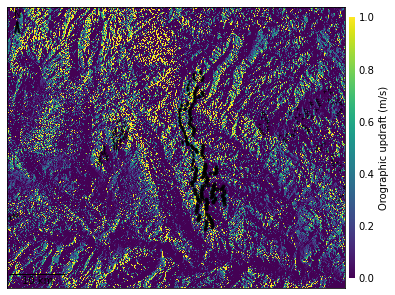

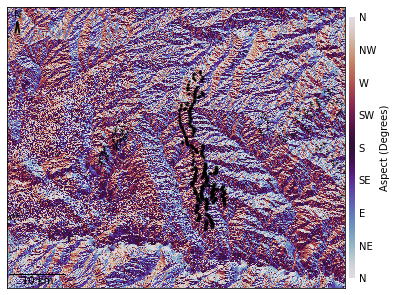

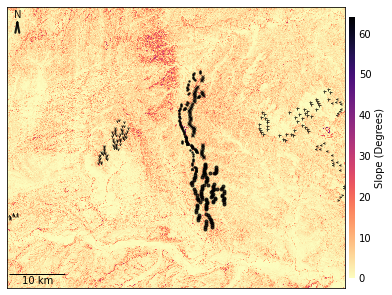

In [11]:
wy_sim_original_compute_10m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh')
wy_sim_original_compute_10m.plot_terrain_aspect(show=True, plot='pcolormesh')
wy_sim_original_compute_10m.plot_terrain_slope(show=True, plot='pcolormesh')

## 10 m resolution, 3DEP quantities

Plotting updraft fields..


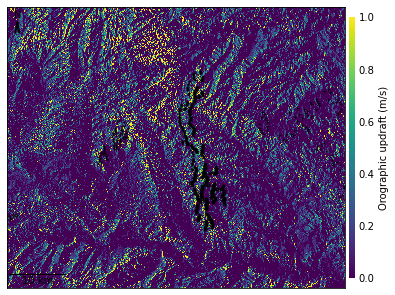

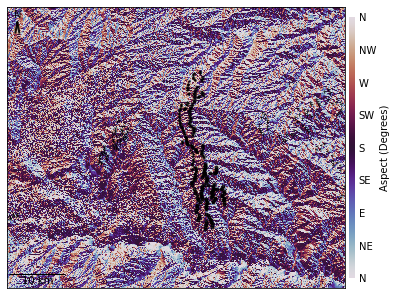

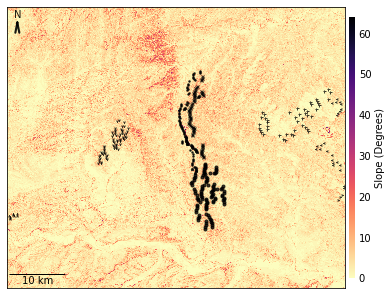

In [12]:
wy_sim_original_3dep_10m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh')
wy_sim_original_3dep_10m.plot_terrain_aspect(show=True, plot='pcolormesh')
wy_sim_original_3dep_10m.plot_terrain_slope(show=True, plot='pcolormesh')

# Further comparisons and differences

In [13]:
from mmctools.coupling.terrain import calcVRM, calc_slope

In [14]:
# 100 m
res=100

# elevation
elev_100m = np.load('output/orographic_original_compute_100m/data/uniform/s10d270th2_elev_originalModel.npy')

# richdem
_, sloperichdem_100m, aspectrichdem_100m_ = calcVRM(elev_100m, res=res, footprint=np.ones((3,3)), fill_depressions=False, return_slope_aspect=True)
aspectrichdem_100m = (aspectrichdem_100m_-90)%360
aspectrichdem_100m = (-aspectrichdem_100m+90)%360

# mmctools version
slopemmc_100m = calc_slope(x=np.array([[0,0],[res,0]]), y=np.array([[0,res],[0,0]]), z=elev_100m)

# computed and download versions, from ssrs
slopecomputed_100m = np.load('output/orographic_original_compute_100m/data/uniform/s10d270th2_slope_originalModel.npy')
slopedownload_100m = np.load('output/orographic_original_3dep_100m/data/uniform/s10d270th2_slope_originalModel.npy')

aspectcomputed_100m = np.load('output/orographic_original_compute_100m/data/uniform/s10d270th2_aspect_originalModel.npy')
#aspectcomputed_100m = (-aspectcomputed_100m+90)%360
aspectdownload_100m = np.load('output/orographic_original_3dep_100m/data/uniform/s10d270th2_aspect_originalModel.npy')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.0122504====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.0173164====================== ] (99% - 0.0s - 1 threads)


In [15]:
# 10 m
res=10

# elevation
elev_10m = np.load('output/orographic_original_compute_10m/data/uniform/s10d270th2_elev_originalModel.npy')

# richdem
_, sloperichdem_10m, aspectrichdem_10m_ = calcVRM(elev_10m, res=res, footprint=np.ones((3,3)), fill_depressions=False, return_slope_aspect=True)
aspectrichdem_10m = (aspectrichdem_10m_-90)%360
aspectrichdem_10m = (-aspectrichdem_10m+90)%360

# mmctools version
slopemmc_10m = calc_slope(x=np.array([[0,0],[res,0]]), y=np.array([[0,res],[0,0]]), z=elev_10m)

# computed and download versions, from ssrs
slopecomputed_10m = np.load('output/orographic_original_compute_10m/data/uniform/s10d270th2_slope_originalModel.npy')
slopedownload_10m = np.load('output/orographic_original_3dep_10m/data/uniform/s10d270th2_slope_originalModel.npy')

aspectcomputed_10m = np.load('output/orographic_original_compute_10m/data/uniform/s10d270th2_aspect_originalModel.npy')
#aspectcomputed_10m = (-aspectcomputed_10m+90)%360
aspectdownload_10m = np.load('output/orographic_original_3dep_10m/data/uniform/s10d270th2_aspect_originalModel.npy')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 1.26436======================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 1.5396========================= ] (99% - 0.0s - 1 threads)


Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


## Plot slope comparison at 10 m resolution

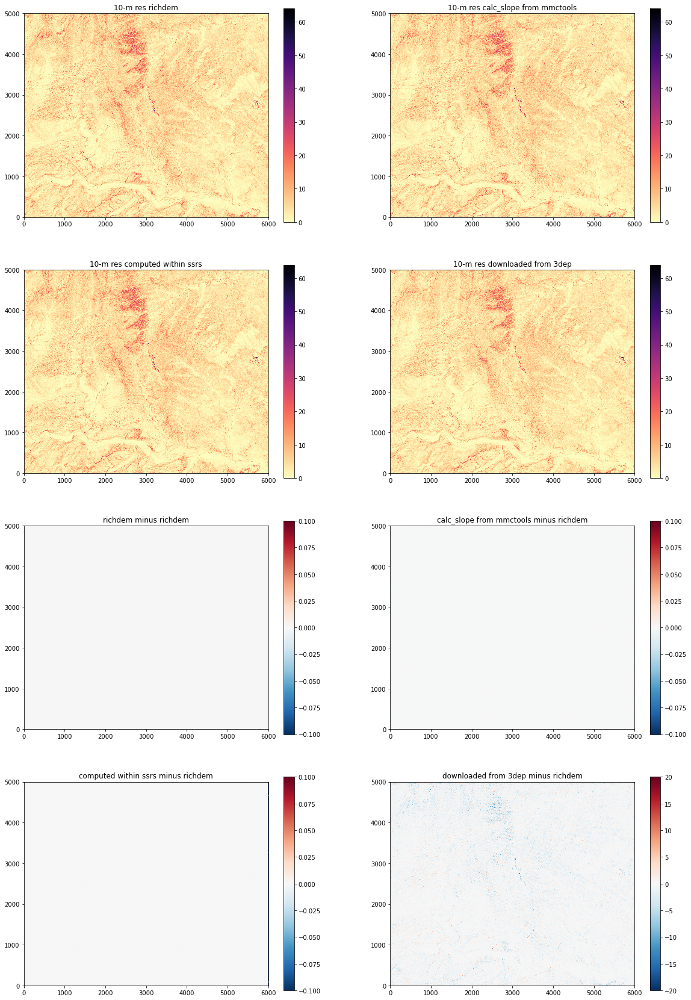

In [16]:
# slope 10 m resolution

fig, axs = plt.subplots(ncols=2, nrows=4, figsize=(20,30))
axs=axs.flatten()

a = axs[0].pcolormesh(sloperichdem_10m, cmap='magma_r')
fig.colorbar(a,ax=axs[0])
axs[0].set_title('10-m res richdem')

a = axs[1].pcolormesh(slopemmc_10m, cmap='magma_r')
fig.colorbar(a,ax=axs[1])
axs[1].set_title('10-m res calc_slope from mmctools')

a = axs[2].pcolormesh(slopecomputed_10m, cmap='magma_r')
fig.colorbar(a,ax=axs[2])
axs[2].set_title('10-m res computed within ssrs')

a = axs[3].pcolormesh(slopedownload_10m, cmap='magma_r')
fig.colorbar(a,ax=axs[3])
axs[3].set_title('10-m res downloaded from 3dep')


vmin=-0.1
vmax=0.1

a = axs[4].pcolormesh(sloperichdem_10m-sloperichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
fig.colorbar(a,ax=axs[4])
axs[4].set_title('richdem minus richdem')

a = axs[5].pcolormesh(slopemmc_10m-sloperichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
fig.colorbar(a,ax=axs[5])
axs[5].set_title('calc_slope from mmctools minus richdem')

a = axs[6].pcolormesh(slopecomputed_10m-sloperichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
fig.colorbar(a,ax=axs[6])
axs[6].set_title('computed within ssrs minus richdem')

a = axs[7].pcolormesh(slopedownload_10m-sloperichdem_10m, cmap='RdBu_r', vmin=-20, vmax=20)
fig.colorbar(a,ax=axs[7])
axs[7].set_title('downloaded from 3dep minus richdem')

for ax in axs: ax.set_aspect('equal')

## Plot slope comparison at 100 m resolution

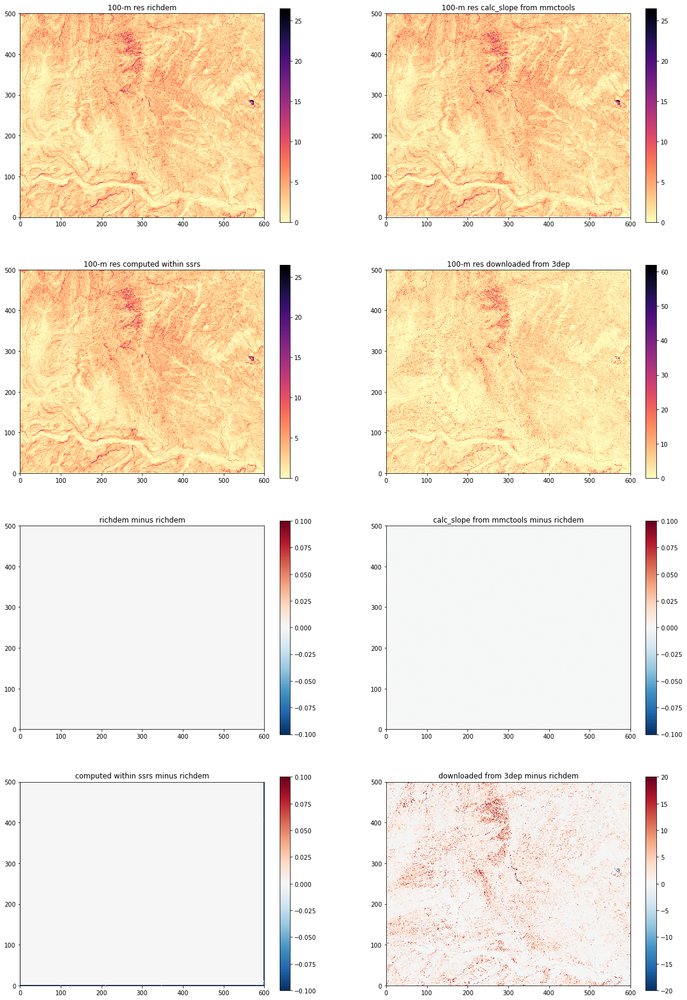

In [17]:
# slope 100 m resolution

fig, axs = plt.subplots(ncols=2, nrows=4, figsize=(20,30))
axs=axs.flatten()

a = axs[0].pcolormesh(sloperichdem_100m, cmap='magma_r', vmin=0, vmax=26.5)
fig.colorbar(a,ax=axs[0])
axs[0].set_title('100-m res richdem')

a = axs[1].pcolormesh(slopemmc_100m, cmap='magma_r', vmin=0, vmax=26.5)
fig.colorbar(a,ax=axs[1])
axs[1].set_title('100-m res calc_slope from mmctools')

a = axs[2].pcolormesh(slopecomputed_100m, cmap='magma_r', vmin=0, vmax=26.5)
fig.colorbar(a,ax=axs[2])
axs[2].set_title('100-m res computed within ssrs')

a = axs[3].pcolormesh(slopedownload_100m, cmap='magma_r', vmin=0, vmax=62)
fig.colorbar(a,ax=axs[3])
axs[3].set_title('100-m res downloaded from 3dep')


vmin=-0.1
vmax=0.1

a = axs[4].pcolormesh(sloperichdem_100m-sloperichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
fig.colorbar(a,ax=axs[4])
axs[4].set_title('richdem minus richdem')

a = axs[5].pcolormesh(slopemmc_100m-sloperichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
fig.colorbar(a,ax=axs[5])
axs[5].set_title('calc_slope from mmctools minus richdem')

a = axs[6].pcolormesh(slopecomputed_100m-sloperichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
fig.colorbar(a,ax=axs[6])
axs[6].set_title('computed within ssrs minus richdem')

a = axs[7].pcolormesh(slopedownload_100m-sloperichdem_100m, cmap='RdBu_r', vmin=-20, vmax=20)
fig.colorbar(a,ax=axs[7])
axs[7].set_title('downloaded from 3dep minus richdem')

for ax in axs: ax.set_aspect('equal')

## Plot aspect comparison at 10 m resolution

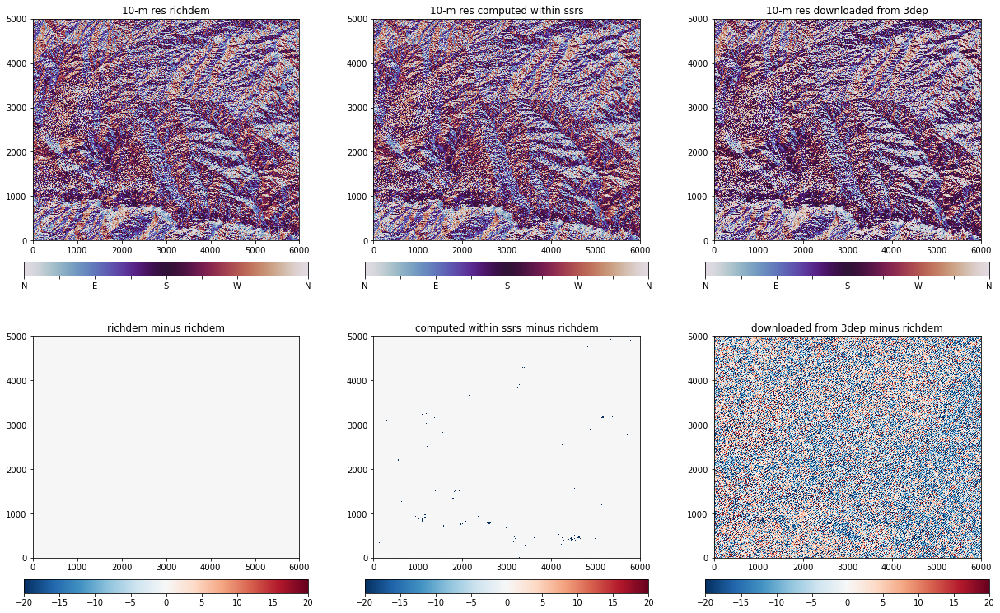

In [18]:
# aspect 10 m res
fig, axs = plt.subplots(ncols=3, nrows=2, figsize=(21,13))
axs=axs.flatten()

zoom=False

vmin=-20
vmax=20

a = axs[0].pcolormesh(aspectrichdem_10m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[0], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[0].set_title('10-m res richdem')

a = axs[1].pcolormesh(aspectcomputed_10m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[1], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[1].set_title('10-m res computed within ssrs')

a = axs[2].pcolormesh(aspectdownload_10m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[2], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[2].set_title('10-m res downloaded from 3dep')


a = axs[3].pcolormesh(aspectrichdem_10m-aspectrichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[3], orientation='horizontal', pad=0.08, fraction=0.08)
axs[3].set_title('richdem minus richdem')

a = axs[4].pcolormesh(aspectcomputed_10m-aspectrichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[4], orientation='horizontal', pad=0.08, fraction=0.08)
axs[4].set_title('computed within ssrs minus richdem')

a = axs[5].pcolormesh(aspectdownload_10m-aspectrichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[5],  orientation='horizontal', pad=0.08, fraction=0.08)
axs[5].set_title('downloaded from 3dep minus richdem')

if zoom:
    for ax in axs:
        ax.set_xlim([3280, 3780])
        ax.set_ylim([1590, 2090])
        
for ax in axs: ax.set_aspect('equal')

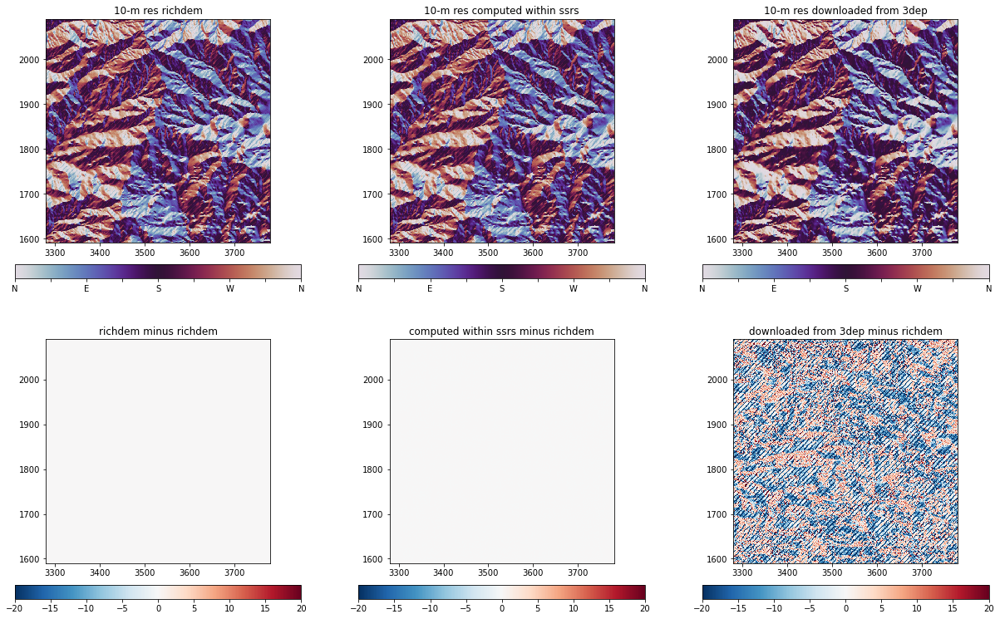

In [19]:
# aspect 10 m res, zoom
fig, axs = plt.subplots(ncols=3, nrows=2, figsize=(21,13))
axs=axs.flatten()

zoom=True

vmin=-20
vmax=20

a = axs[0].pcolormesh(aspectrichdem_10m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[0], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[0].set_title('10-m res richdem')

a = axs[1].pcolormesh(aspectcomputed_10m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[1], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[1].set_title('10-m res computed within ssrs')

a = axs[2].pcolormesh(aspectdownload_10m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[2], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[2].set_title('10-m res downloaded from 3dep')


a = axs[3].pcolormesh(aspectrichdem_10m-aspectrichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[3], orientation='horizontal', pad=0.08, fraction=0.08)
axs[3].set_title('richdem minus richdem')

a = axs[4].pcolormesh(aspectcomputed_10m-aspectrichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[4], orientation='horizontal', pad=0.08, fraction=0.08)
axs[4].set_title('computed within ssrs minus richdem')

a = axs[5].pcolormesh(aspectdownload_10m-aspectrichdem_10m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[5],  orientation='horizontal', pad=0.08, fraction=0.08)
axs[5].set_title('downloaded from 3dep minus richdem')

if zoom:
    for ax in axs:
        ax.set_xlim([3280, 3780])
        ax.set_ylim([1590, 2090])
        
for ax in axs: ax.set_aspect('equal')

## Plot aspect comparison at 100 m resolution

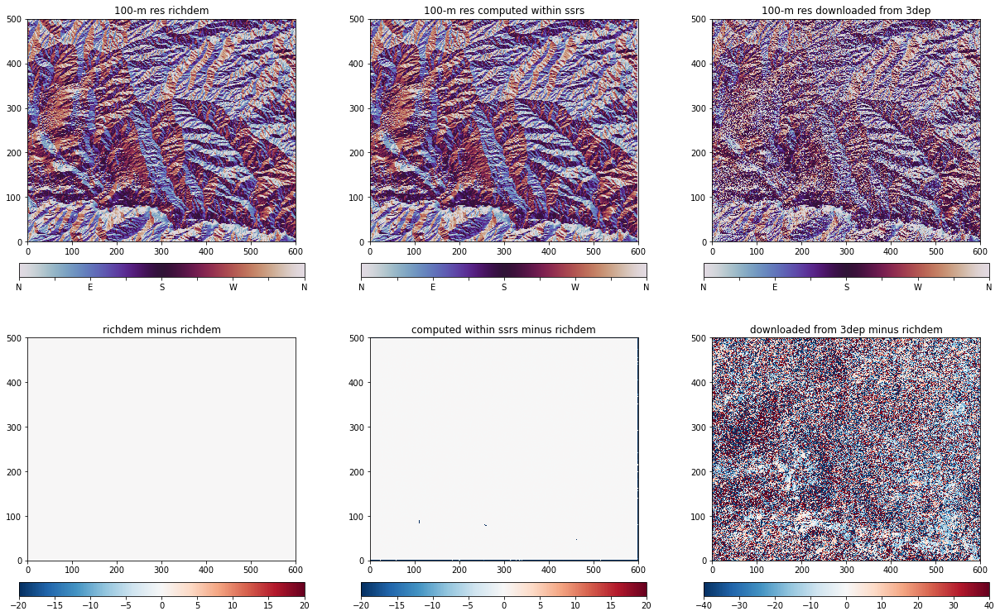

In [20]:
# aspect 100 m res
fig, axs = plt.subplots(ncols=3, nrows=2, figsize=(21,13))
axs=axs.flatten()

zoom=False

vmin=-20
vmax=20

a = axs[0].pcolormesh(aspectrichdem_100m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[0], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[0].set_title('100-m res richdem')

a = axs[1].pcolormesh(aspectcomputed_100m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[1], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[1].set_title('100-m res computed within ssrs')

a = axs[2].pcolormesh(aspectdownload_100m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[2], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[2].set_title('100-m res downloaded from 3dep')


a = axs[3].pcolormesh(aspectrichdem_100m-aspectrichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[3], orientation='horizontal', pad=0.08, fraction=0.08)
axs[3].set_title('richdem minus richdem')

a = axs[4].pcolormesh(aspectcomputed_100m-aspectrichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[4], orientation='horizontal', pad=0.08, fraction=0.08)
axs[4].set_title('computed within ssrs minus richdem')

a = axs[5].pcolormesh(aspectdownload_100m-aspectrichdem_100m, cmap='RdBu_r', vmin=-40, vmax=40)
cb = fig.colorbar(a,ax=axs[5],  orientation='horizontal', pad=0.08, fraction=0.08)
axs[5].set_title('downloaded from 3dep minus richdem')

if zoom:
    for ax in axs:
        ax.set_xlim([328, 378])
        ax.set_ylim([159, 209])

for ax in axs: ax.set_aspect('equal')

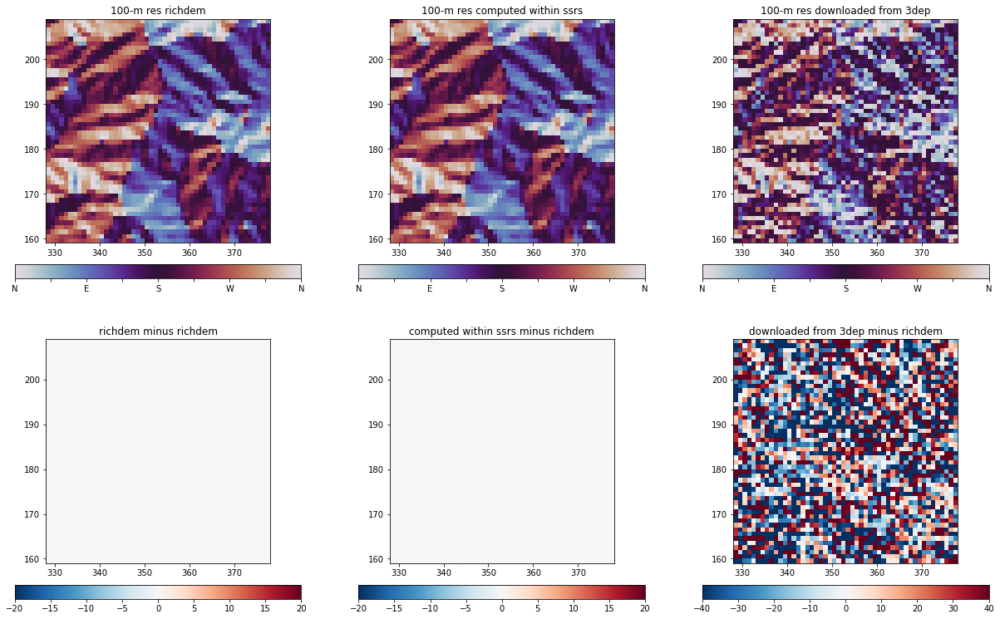

In [21]:
# aspect 100 m res, zoom
fig, axs = plt.subplots(ncols=3, nrows=2, figsize=(21,13))
axs=axs.flatten()

zoom=True

vmin=-20
vmax=20

a = axs[0].pcolormesh(aspectrichdem_100m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[0], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[0].set_title('100-m res richdem')

a = axs[1].pcolormesh(aspectcomputed_100m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[1], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[1].set_title('100-m res computed within ssrs')

a = axs[2].pcolormesh(aspectdownload_100m, cmap='twilight',vmin=0, vmax=360)
cb = fig.colorbar(a,ax=axs[2], ticks=[0,45,90,135,180,225,270,315,360], orientation='horizontal', pad=0.08, fraction=0.08)
cb.ax.set_xticklabels(['N','','E','','S','','W','','N'])
axs[2].set_title('100-m res downloaded from 3dep')


a = axs[3].pcolormesh(aspectrichdem_100m-aspectrichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[3], orientation='horizontal', pad=0.08, fraction=0.08)
axs[3].set_title('richdem minus richdem')

a = axs[4].pcolormesh(aspectcomputed_100m-aspectrichdem_100m, cmap='RdBu_r', vmin=vmin, vmax=vmax)
cb = fig.colorbar(a,ax=axs[4], orientation='horizontal', pad=0.08, fraction=0.08)
axs[4].set_title('computed within ssrs minus richdem')

a = axs[5].pcolormesh(aspectdownload_100m-aspectrichdem_100m, cmap='RdBu_r', vmin=-40, vmax=40)
cb = fig.colorbar(a,ax=axs[5],  orientation='horizontal', pad=0.08, fraction=0.08)
axs[5].set_title('downloaded from 3dep minus richdem')

if zoom:
    for ax in axs:
        ax.set_xlim([328, 378])
        ax.set_ylim([159, 209])

for ax in axs: ax.set_aspect('equal')